In [1]:
using Flight.FlightCore.Systems
using Flight.FlightCore.Plotting

using Flight.FlightPhysics
using Flight.FlightComponents
using Flight.FlightAircraft.C172FBW
using Flight.FlightAircraft.C172

using Flight.FlightComponents.Control.Discrete: PIDParams
using Flight.FlightComponents.Control.PIDOpt: Settings, Metrics, optimize_PID, build_PID, check_results

using UnPack
using ControlSystems
using RobustAndOptimalControl

In [2]:
ac = Cessna172FBWBase(NED()) |> System #linearization requires NED kinematics

#same mass in all cases
fwd_cg_pld = C172.PayloadU(m_pilot = 100, m_copilot = 100, m_baggage = 0)
aft_cg_pld = C172.PayloadU(m_pilot = 50, m_copilot = 50, m_baggage = 100)
mid_cg_pld = C172.PayloadU(m_pilot = 75, m_copilot = 75, m_baggage = 50)

design_condition_1 = C172.TrimParameters(
    Ob = Geographic(LatLon(), HOrth(1000)),
    EAS = 25.0,
    γ_wOb_n = 0.0,
    x_fuel = 0.5,
    flaps = 1.0,
    payload = mid_cg_pld)

design_condition_2 = C172.TrimParameters(
    Ob = Geographic(LatLon(), HOrth(1000)),
    EAS = 55.0,
    γ_wOb_n = 0.0,
    x_fuel = 0.5,
    flaps = 0.0,
    payload = mid_cg_pld)

ail_rud_MIMO = Control.Continuous.LinearizedSS(ac, design_condition_2; model = :lat) |> named_ss;

## 1. Roll Rate

In [3]:
P_a2p = ail_rud_MIMO[:p, :aileron_cmd]
P_a2p = minreal(P_a2p, 1e-4)
zeros_a2p = zpkdata(P_a2p)[1][1]
ωn_a2p, ζ_a2p, poles_a2p = damp(P_a2p)
dampreport(P_a2p)
# zeros_a2p |> display
# poles_a2p |> display
# ωn_a2p |> display
# ζ_a2p |> display

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+


| -0.0282            |  1            |  0.0282       |  0.00449      |  35.5         |
| -0.108             |  1            |  0.108        |  0.0172       |  9.25         |


| -0.735  ±   2.94im |  0.243        |  3.03         |  0.482        |  1.36         |
| -11.5              |  1            |  11.5         |  1.84         |  0.0866       |
| -18.8   ±   25.1im |  0.6          |  31.4         |  5            |  0.0531       |


We have:
- A very fast real pole corresponding to the $\beta$ filter.
- Two pairs of very fast complex poles, corresponding to the aileron and rudder actuators
- A fast real pole, corresponding to the roll subsidence mode.
- A pair of slow, lightly damped complex poles, corresponding to the Dutch roll mode
- A slow pole, corresponding to the spiral mode. Depending on the operating condition this pole can be stable or unstable, and it has a slow zero nearby.
- A slow stable real pole, cancelled by a zero, don't know where it comes from.
- A pole at the origin, cancelled by a corresponding zero.

The near-cancellation of the spiral pole with the nearby zero suggests that the spiral mode is not fully controllable by a SISO roll rate to aileron control path only. It also means that its short-term effect in the dynamic response is negligible for the purposes of roll rate control design. We can expect that by adding sideslip control to roll rate control later on we will be able to stabilize the spiral mode.

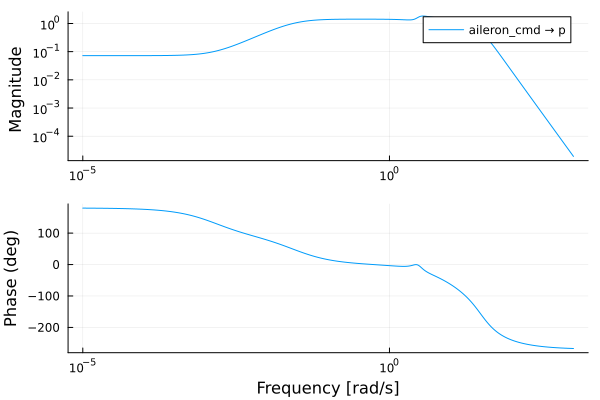

In [4]:
bodeplot(P_a2p)

┌ Warning: Keyword argument hover not supported with Plots.GRBackend().  Choose from: annotationcolor, annotationfontfamily, annotationfontsize, annotationhalign, annotationrotation, annotations, annotationvalign, arrow, aspect_ratio, axis, background_color, background_color_inside, background_color_outside, background_color_subplot, bar_width, bins, bottom_margin, camera, clims, color_palette, colorbar, colorbar_entry, colorbar_scale, colorbar_title, colorbar_titlefont, colorbar_titlefontcolor, colorbar_titlefontrotation, colorbar_titlefontsize, connections, contour_labels, discrete_values, fill, fill_z, fillalpha, fillcolor, fillrange, fillstyle, flip, fontfamily, fontfamily_subplot, foreground_color, foreground_color_axis, foreground_color_border, foreground_color_grid, foreground_color_subplot, foreground_color_text, formatter, framestyle, grid, gridalpha, gridlinewidth, gridstyle, group, guide, guidefont, guidefontcolor, guidefontfamily, guidefonthalign, guidefontrotation, guidefo

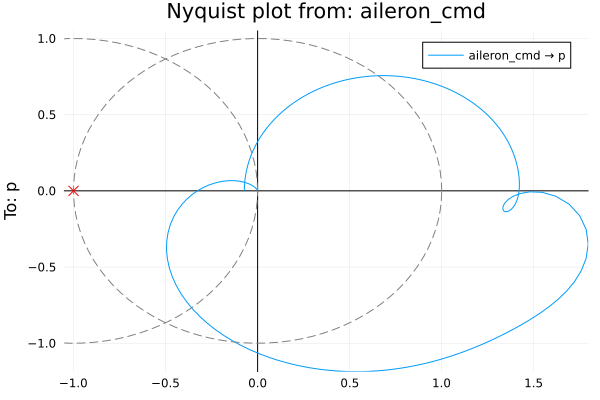

In [5]:
nyquistplot(P_a2p; unit_circle = true, Ms_circles = [1.0])
# plot!(ylims = (-2,2), xlims = (-2,2))

Because the open loop transfer function may be unstable, we cannot apply the final value theorem here. We will inspect the step response directly by simulation.

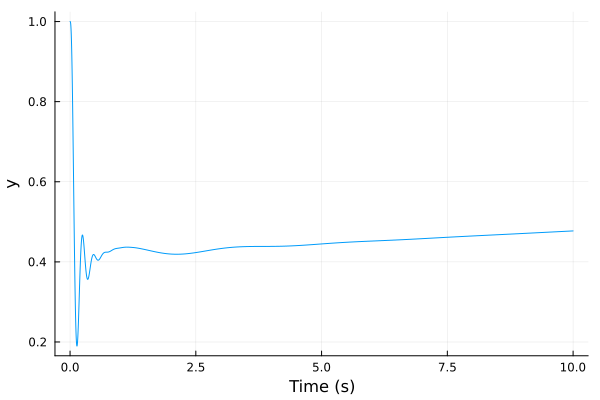

In [6]:
ε_a2p_cl = 1/(1+tf(P_a2p))
step(ε_a2p_cl, 10) |> plot

Even though the system potentially has an unstable and uncontrollable pole, we can still use PID optimization to get a useful result, in the sense of controlling the stable part of the sytem. Things to note:

- If the loop transfer function has unstable poles, one or more encirclements of (-1, 0) are required for it to be stable. Therefore, maintaining a minimum distance 1/|Ms| to (-1, 0) is no longer a guarantee of stability. However, it still is a useful metric for the short-term stability of the stable part of the system. 
- Both $\int{e}$ and $e_f$ will of course be infinite over a long enough time window, because no matter how diminished the influence of the unstable poles by corresponding zeros, they will cause divergence in the end. However, for a sufficiently small simulation time window, where their contribution is still negligible, the error metrics can still be minimized by the choice of PID parameters.

In [7]:
#the measurement noise to control input response is C/(1+PC), so its bandwidth
#is given basically by the controller's bandwidth. roll rate feedback will
#typically come from a gyro and will contain high frequency noise. therefore, we
#would like the controller to have a high frequency rolloff to protect the
#actuators. load disturbance to output response is P/(1+PC), so its bandwidth is
#limited by the plant's bandwidth. this means that the output is protected from
#high-frequency load disturbances by the low-pass filter behavior of the plant
#itself.

t_sim_p2a = 5
upper_bounds = PIDParams(; k_p = 50.0, k_i = 20.0, k_d = 0.0, τ_f = 0.01)
settings = Settings(; t_sim = t_sim_p2a, upper_bounds)
weights = Metrics(; Ms = 1, ∫e = 10, ef = 1, ∫u = 0, up = 0.1)
params_0 = PIDParams(; k_p = 1, k_i = 5, k_d = 0.01, τ_f = 0.01)

p2a_results = optimize_PID(P_a2p; params_0, settings, weights, global_search = false)
p2a_results.exit_flag |> display

@unpack k_p, k_i, k_d, T_i, T_d = p2a_results.params
@show k_p, k_i, k_d, T_i, T_d
@show p2a_results.metrics

p2a_PID = build_PID(p2a_results.params)
C_p2a = p2a_PID
C_p2a = named_ss(C_p2a, :C_p2a; u = :p_err, y = :aileron_cmd_sp);


:ROUNDOFF_LIMITED

(k_p, k_i, k_d, T_i, T_d) = (0.29915175247740955, 4.401358918320699, 0.0, 0.06796804305874432, 0.0)
p2a_results.metrics = [1.3452332575155954, 0.03890458774851731, 0.004852155379323819, 0.2640652295156824, 0.7008482475225905]


┌ Warning: Connected signals have different names
│  aileron_cmd_sp -> aileron_cmd
└ @ RobustAndOptimalControl C:\Users\Miguel\.julia\packages\RobustAndOptimalControl\CHKAo\src\named_systems2.jl:255


StepInfo:
Initial value:     0.000
Final value:       0.995
Step size:         0.995
Peak:              1.012
Peak time:         1.866 s
Overshoot:          1.69 %
Undershoot:         0.00 %
Settling time:     1.144 s
Rise time:         0.180 s


isstable(T_p2a) = false


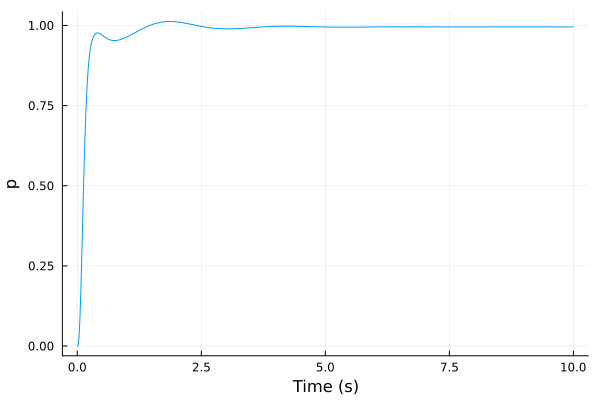

In [8]:
#we expect the roll rate-augmented closed loop system to remain unstable
T_p2a = output_comp_sensitivity(P_a2p, C_p2a) #this is the closed loop transfer function
@show isstable(T_p2a)
T_p2a_step = step(T_p2a, 2t_sim_p2a)
stepinfo(T_p2a_step) |> display
T_p2a_step |> plot

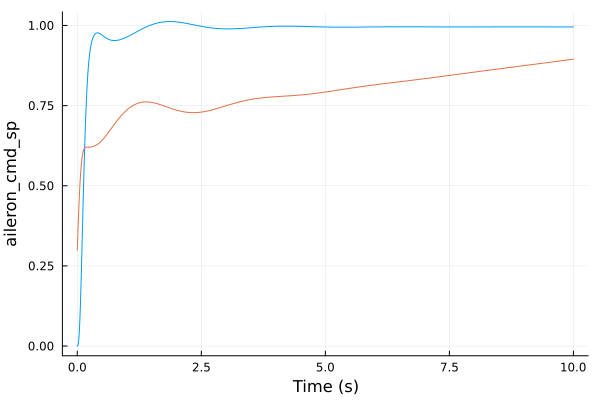

In [9]:
CS_p2a = G_CS(P_a2p, C_p2a)
CS_p2a_step = step(CS_p2a, 2t_sim_p2a)
CS_p2a_step |> plot!

┌ Warning: Connected signals have different names
│  aileron_cmd_sp -> aileron_cmd
└ @ RobustAndOptimalControl C:\Users\Miguel\.julia\packages\RobustAndOptimalControl\CHKAo\src\named_systems2.jl:255


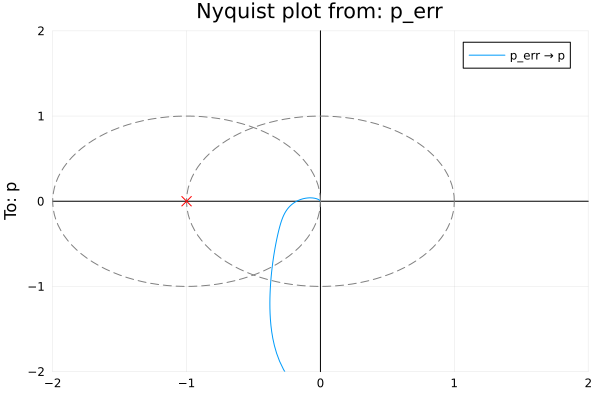

In [10]:
L_p2a = series(C_p2a, P_a2p)
nyquistplot(L_p2a; unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

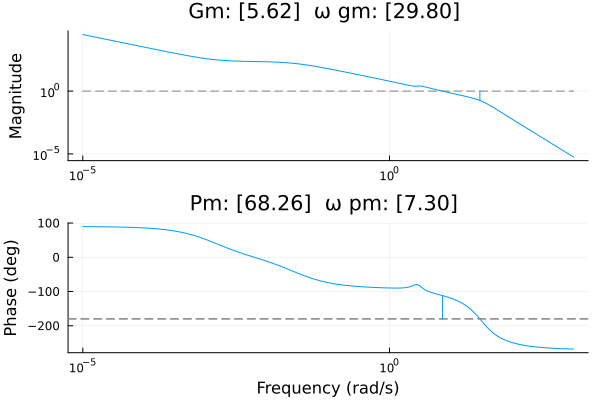

In [11]:
#like the Nyquist plot, the stability margins are not actually a guarantee in
#the presence of unstable poles, but it gives some insight about the
#minimum-phase part of the system
L_p2a = series(C_p2a, P_a2p)
marginplot(L_p2a)

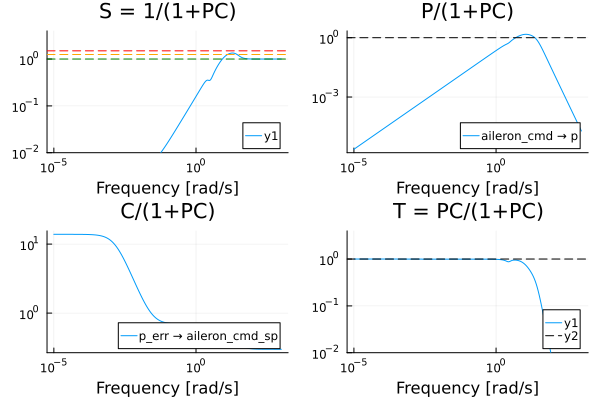

In [12]:
gangoffourplot(P_a2p, C_p2a)

TransferFunction{Continuous, ControlSystemsBase.SisoZpk{Float64, ComplexF64}}
                                                     (1.0s + 14.712796705588632)(1.0s^2 + 1.4713816692192885s + 7.789402727768873)(1.0s + 0.10976011440108646)(1.0s - 0.0014105432814980584)(1.0s + 7.1441620604914e-6)
5738.107798756084-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                 (1.0s^2 + 30.86569479597005s + 740.5922014617049)(1.0s^2 + 18.19342644608553s + 112.58386537337377)(1.0s^2 + 1.6796776516350316s + 7.922040852872404)(1.0s + 0.10978158238695551)(1.0s + 7.14397973920084e-6)(1.0s - 0.0014040684883612586)

Continuous-time transfer function model

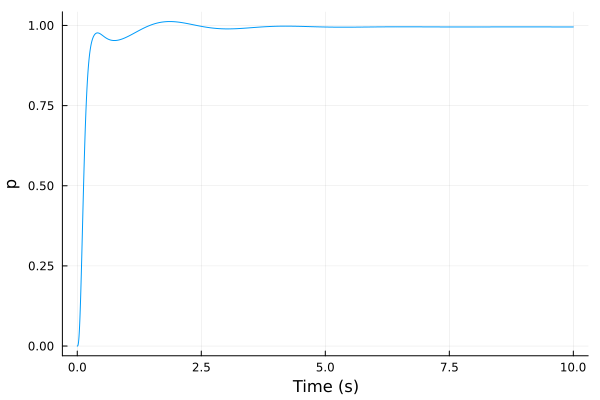

In [13]:
p2a_sum = sumblock("p_err = p_dmd - p")
p_rud_MIMO = connect([p2a_sum, C_p2a, ail_rud_MIMO], [:p_err=>:p_err, :p=>:p, :aileron_cmd_sp=>:aileron_cmd], w1 = [:p_dmd, :rudder_cmd], z1 = ail_rud_MIMO.y)

#check we get the same response as with the SISO closed loop
pdmd2p = p_rud_MIMO[:p, :p_dmd]

#while the spiral mode still persists, its contribution to the
#roll response has basically been eliminated by a near cancellation
zpk(pdmd2p) |> display

step(pdmd2p, 2t_sim_p2a) |> plot


## 2. Bank Angle

In [14]:
P_p2φ = p_rud_MIMO[:φ, :p_dmd]
zpk(P_p2φ)

TransferFunction{Continuous, ControlSystemsBase.SisoZpk{Float64, ComplexF64}}
                                                                  (1.0s + 14.712796705588625)(1.0s^2 + 1.4665176501729866s + 7.788305547580073)(1.0s + 0.10976012504589727)(1.0s + 1.4410094951271034e-7)
5736.93824361854-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                (1.0s^2 + 30.86569479597005s + 740.5922014617049)(1.0s^2 + 18.19342644608553s + 112.58386537337377)(1.0s^2 + 1.6796776516350316s + 7.922040852872404)(1.0s + 0.10978158238695551)(1.0s + 7.14397973920084e-6)(1.0s - 0.0014040684883612586)

Continuous-time transfer function model

In [15]:
t_sim_φ2p = 5
lower_bounds = PIDParams(; k_p = 0.1, k_i = 0.0, k_d = 0.0, τ_f = 0.01)
upper_bounds = PIDParams(; k_p = 50.0, k_i = 10.0, k_d = 0.5, τ_f = 0.01)
settings = Settings(; t_sim = t_sim_φ2p, lower_bounds, upper_bounds)
weights = Metrics(; Ms = 2, ∫e = 10, ef = 1, ∫u = 0.00, up = 0.1)
params_0 = PIDParams(; k_p = 2., k_i = 0., k_d = 0.0, τ_f = 0.01)

φ2p_results = optimize_PID(P_p2φ; params_0, settings, weights, global_search = false)
φ2p_PID = build_PID(φ2p_results.params)
C_φ2p = named_ss(φ2p_PID, :C_φ2p; u = :φ_err, y = :p_dmd);

@unpack k_p, k_i, k_d, T_i, T_d = φ2p_results.params
@show k_p, k_i, k_d, T_i, T_d
@show φ2p_results.metrics
@show φ2p_results.exit_flag


(k_p, k_i, k_d, T_i, T_d) = (2.1792937483729826, 1.042406190291575e-6, 2.331317698654621e-16, 2.0906377654601273e6, 1.0697583565295576e-16)
φ2p_results.metrics = [1.2620917505973521, 0.09862842224993773, 0.000705988685655079, 0.9236317956394735, 1.1792937487025066]
φ2p_results.exit_flag = :ROUNDOFF_LIMITED


:ROUNDOFF_LIMITED

StepInfo:
Initial value:     0.000
Final value:       1.001
Step size:         1.001
Peak:              1.020
Peak time:         1.892 s
Overshoot:          1.97 %
Undershoot:         0.00 %
Settling time:     1.287 s
Rise time:         0.741 s


isstable(T_φ2p) = true


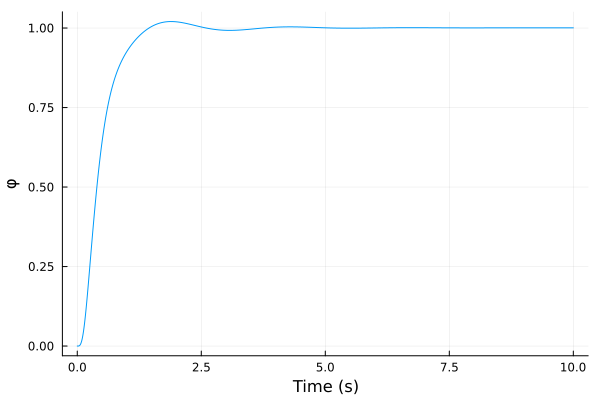

In [16]:
#we can see that bank angle feedback is enough to stabilize the spiral mode.
#this is all we need for automatic flight. roll rate
T_φ2p = output_comp_sensitivity(P_p2φ, C_φ2p) #this is the closed loop transfer function
@show isstable(T_φ2p)
T_φ2p_step = step(T_φ2p, 2t_sim_φ2p)
stepinfo(T_φ2p_step) |> display
T_φ2p_step |> plot


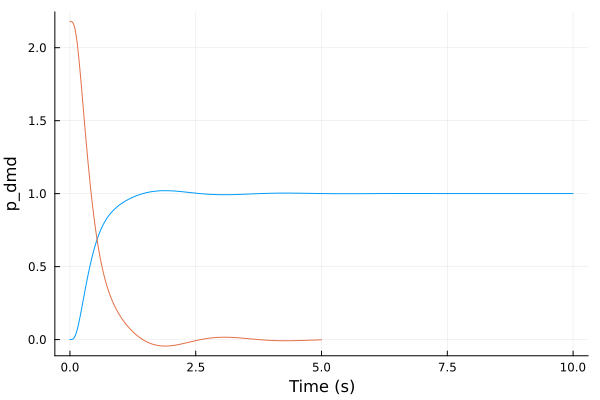

In [17]:
CS_φ2p = G_CS(P_p2φ, C_φ2p)
CS_φ2p_step = step(CS_φ2p, t_sim_φ2p)
CS_φ2p_step |> plot!

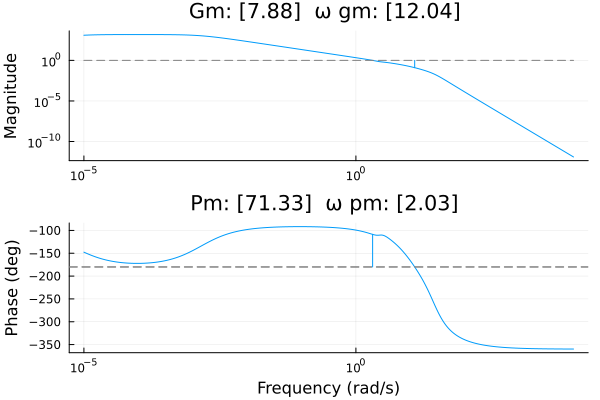

In [18]:
L_φ2p = series(C_φ2p, P_p2φ)
marginplot(L_φ2p)

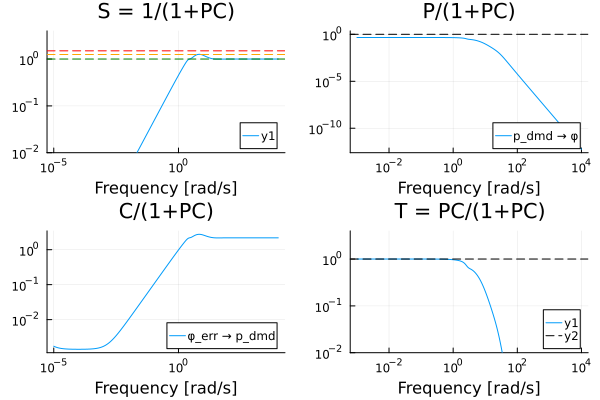

In [19]:
gangoffourplot(P_p2φ, C_φ2p)

In [20]:
zpk(T_φ2p) |> display
poles(T_φ2p) |> display
poles(minreal(T_φ2p, 1e-2)) |> display


TransferFunction{Continuous, ControlSystemsBase.SisoZpk{Float64, ComplexF64}}
                                                                 (1.0s + 99.99999999999903)(1.0s + 14.712796705588655)(1.0s^2 + 1.4665176501730004s + 7.788305547580066)(1.0s + 0.10976012504589712)(1.0s + 4.783229388473892e-7)(1.0s + 1.4410094939182132e-7)
12502.473649119896---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                  (1.0s + 100.0000000000001)(1.0s^2 + 31.69130350093338s + 746.1605778147283)(1.0s^2 + 13.560709167825127s + 67.3454934400745)(1.0s + 3.898228184643254)(1.0s^2 + 1.5871830927765171s + 7.30887585296354)(1.0s + 0.10975898719406645)(1.0s + 4.72103008331026e-7)(1.0s + 1.4609362521586563e-7)

Continuous-time transfer function model

11-element Vector{ComplexF64}:
     -100.0000000000001 + 0.0im
     -15.84565175046669 + 22.250301086000167im
     -15.84565175046669 - 22.250301086000167im
     -6.780354583912564 + 4.623016889055284im
     -6.780354583912564 - 4.623016889055284im
     -3.898228184643254 + 0.0im
    -0.7935915463882586 + 2.584393219009954im
    -0.7935915463882586 - 2.584393219009954im
   -0.10975898719406645 + 0.0im
   -4.72103008331026e-7 + 0.0im
 -1.4609362521586563e-7 + 0.0im

7-element Vector{ComplexF64}:
 -15.845651751269072 + 22.25030108549022im
 -15.845651751269072 - 22.25030108549022im
  -6.780354276822796 + 4.623017483211502im
  -6.780354276822796 - 4.623017483211502im
   -3.89823878548926 + 0.0im
 -0.7935291491667826 + 2.5844571801913845im
 -0.7935291491667826 - 2.5844571801913845im

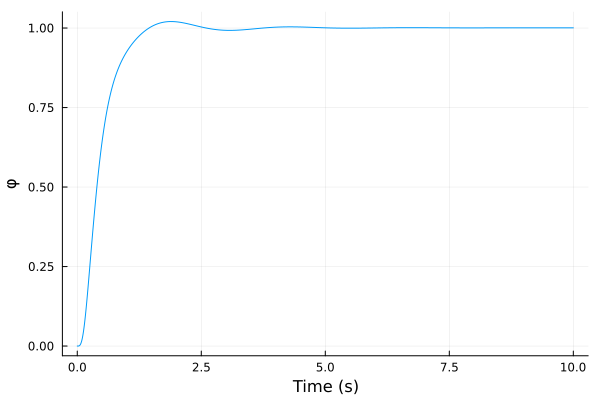

In [21]:
φ2p_sum = sumblock("φ_err = φ_dmd - φ")
φ_rud_MIMO = connect([φ2p_sum, C_φ2p, p_rud_MIMO], [:φ_err=>:φ_err, :φ=>:φ, :p_dmd=>:p_dmd], w1 = [:φ_dmd, :rudder_cmd], z1 = p_rud_MIMO.y)

#check we get the same response as with the SISO closed loop
φdmd2φ = φ_rud_MIMO[:φ, :φ_dmd]
step(φdmd2φ, 2t_sim_φ2p) |> plot

## 3. Course Angle

We start from the plant with embedded bank angle control.

In [22]:
P_φ2χ = φ_rud_MIMO[:χ, :φ_dmd]
P_φ2χ = minreal(P_φ2χ, 1e-2) #simplify pole-zero cancellations
zpk(P_φ2χ) |> display
isstable(P_φ2χ)

TransferFunction{Continuous, ControlSystemsBase.SisoZpk{Float64, ComplexF64}}
                                                         (1.0s + 14.712796703317577)(1.0s^2 - 0.3292279966000371s + 9.220444068002877)(1.0s^2 + 1.2291633063871177s + 13.17747081150856)
132.47685970400823-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                  (1.0s^2 + 31.691303500745786s + 746.1605778064782)(1.0s^2 + 13.56070885153466s + 67.34548895760477)(1.0s + 3.898217242071724)(1.0s^2 + 1.5871979338121307s + 7.308589012885376)(1.0s + 1.4274164694660978e-7)

Continuous-time transfer function model

true

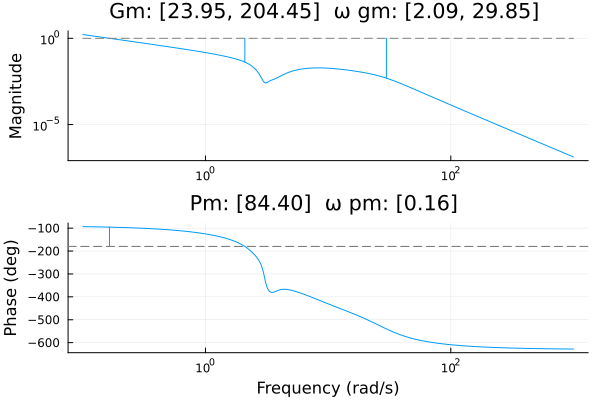

In [23]:
marginplot(P_φ2χ)

isstable(ε_φ2χ_cl) = true


ε_φ2χ_cl(0) = [8.629220337892277e-7;;]


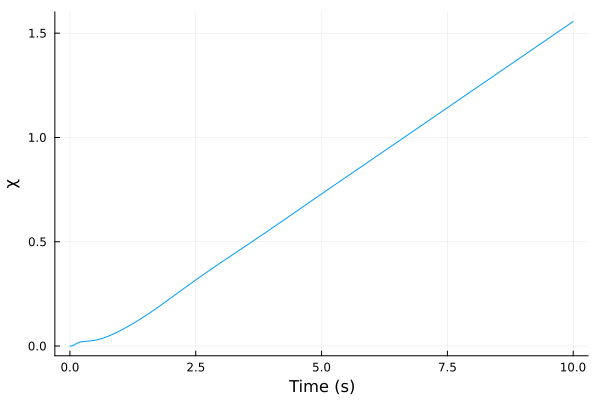

In [24]:
ɛ_φ2χ_cl = 1/(1+tf(P_φ2χ))
@show isstable(ɛ_φ2χ_cl)
@show ɛ_φ2χ_cl(0) #steady state error is negligible
step(P_φ2χ, 10) |> plot

In [25]:
k_p_χ2φ = 5
T_i_χ2φ = 15
T_d_χ2φ = 0.0
τ_f_χ2φ = 0.01
@show k_i_χ2φ = k_p_χ2φ / T_i_χ2φ
@show k_d_χ2φ = k_p_χ2φ * T_d_χ2φ
χ2φ_PID = build_PID(PIDParams(; k_p = k_p_χ2φ, k_i = k_i_χ2φ, k_d = k_d_χ2φ, τ_f = τ_f_χ2φ))
C_χ2φ = named_ss(χ2φ_PID, :χcmp; u = :χ_err, y = :φ_dmd);

k_i_χ2φ = k_p_χ2φ / T_i_χ2φ = 0.3333333333333333
k_d_χ2φ = k_p_χ2φ * T_d_χ2φ = 0.0


In [26]:
t_sim_χ2φ = 30
#to achieve zero steady-state error in the presence of wind, we need the
#controller to have a low frequency roll-off in the load disturbance to output
#response P/(1+P). this in turn requires forcing the optimization to include
#some amount of integral gain
lower_bounds = PIDParams(; k_p = 0.1, k_i = 0.3, k_d = 0.0, τ_f = 0.01)
upper_bounds = PIDParams(; k_p = 10.0, k_i = 5.0, k_d = 0.5, τ_f = 0.01)
settings = Settings(; t_sim = t_sim_χ2φ, lower_bounds, upper_bounds)
weights = Metrics(; Ms = 2, ∫e = 10, ef = 1, ∫u = 0.00, up = 0.1)
params_0 = PIDParams(; k_p = 3., k_i = 0., k_d = 0.0, τ_f = 0.01)

χ2φ_results = optimize_PID(P_φ2χ; params_0, settings, weights, global_search = false)
χ2φ_PID = build_PID(χ2φ_results.params)
C_χ2φ = named_ss(χ2φ_PID, :C_χ2φ; u = :χ_err, y = :φ_dmd);

@unpack k_p, k_i, k_d, T_i, T_d = χ2φ_results.params
@show k_p, k_i, k_d, T_i, T_d
@show χ2φ_results.metrics
@show χ2φ_results.exit_flag

(k_p, k_i, k_d, T_i, T_d) = (3.0573097773824944, 0.300000000000036, 2.194981615097568e-13, 10.191032591273759, 7.179454405751431e-14)
χ2φ_results.metrics = [1.2949819828278737, 0.1121877779774923, 0.009123462283641803, 1.0136284851961481, 2.062260304385114]
χ2φ_results.exit_flag = :ROUNDOFF_LIMITED


:ROUNDOFF_LIMITED

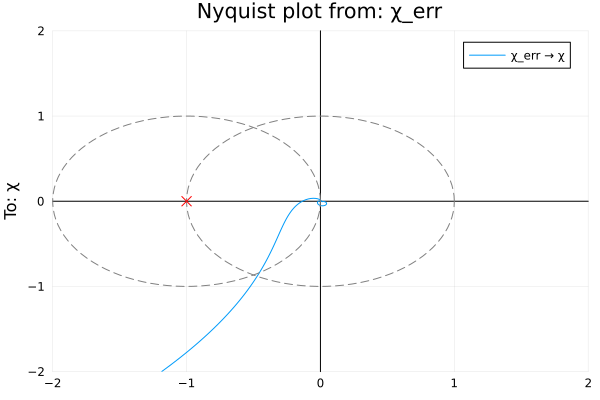

In [27]:
L_χ2φ = series(C_χ2φ, P_φ2χ)
nyquistplot(L_χ2φ, unit_circle = true, Ms_circles = [1.0])
plot!(ylims = (-2,2), xlims = (-2,2))

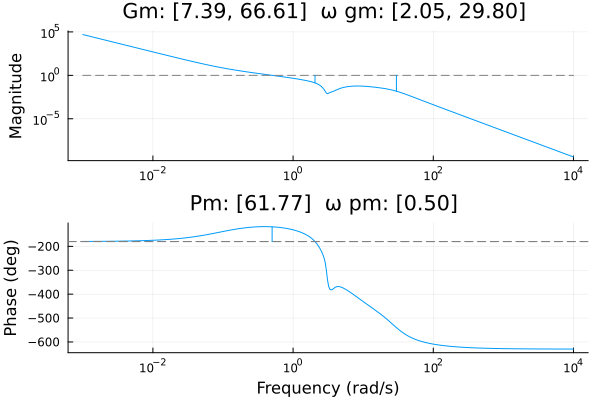

In [28]:
marginplot(L_χ2φ)

Here we are particularly interested in the load disturbance to output transfer function P/(1+C). In order for the controller to be able to counter the effects of crosswind, this function needs to show low frequency roll-off. This is only possible with integral action.

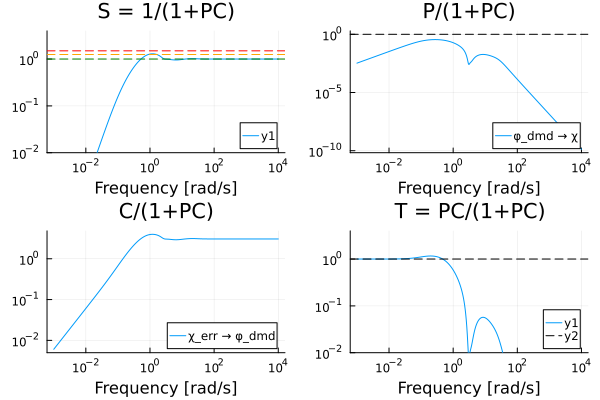

In [29]:
gangoffourplot(P_φ2χ, C_χ2φ)

For the step response it is important to consider the input to control signal response, because obviously our bank angle demand will be limited

StepInfo:
Initial value:     0.000
Final value:       1.000
Step size:         1.000
Peak:              1.148
Peak time:         6.536 s
Overshoot:         14.82 %
Undershoot:         0.00 %
Settling time:    23.800 s
Rise time:         2.285 s


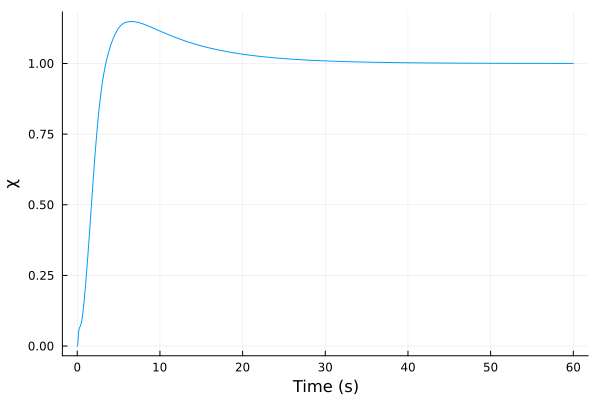

In [30]:
T_χ2φ = output_comp_sensitivity(P_φ2χ, C_χ2φ) #input to output response
T_χ2φ_step = step(T_χ2φ, 2t_sim_χ2φ)
stepinfo(T_χ2φ_step) |> display
T_χ2φ_step |> plot

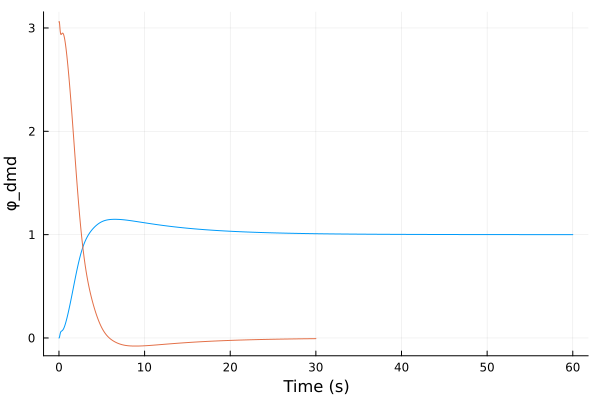

In [31]:
CS_χ2φ = G_CS(P_φ2χ, C_χ2φ) #input to control signal response
CS_χ2φ_step = step(CS_χ2φ, t_sim_χ2φ)
CS_χ2φ_step |> plot!